## https://www.learnopencv.com/keras-tutorial-fine-tuning-using-pre-trained-models/

In [1]:
from os import path
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from keras.models import Model
from keras.layers import Dense
from keras.layers import Flatten
from keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPool2D
from keras import backend as K
from keras.optimizers import Adam
from tensorflow.keras.layers import Dropout
from keras import optimizers
import matplotlib.pyplot as plt 
import numpy as np 


In [2]:
from tensorflow.keras.applications import vgg16

# Init the VGG model 
vgg_conv = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(244, 244, 3))

In [3]:
# Freeze all the layers
for layer in vgg_conv.layers[:]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x0000018665A99430> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001866E6367C0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001866E636E20> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001866E6561C0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001866E6C1490> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001866E6C9910> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001866E656190> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001866E6D9970> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001866E6DF7F0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001866E6DF5E0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001866F6B4D00> False
<tensorflow.python.

In [4]:
# Create the model
model = Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dense (Dense)                (None, 1024)              25691136  
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 2050      
Total params: 40,407,874
Trainable params: 25,693,186
Non-trainable params: 14,714,688
_________________________________________________________________


In [5]:
train = "D:/Dogs-Cats/cats_and_dogs_filtered/train"
validation = "D:/Dogs-Cats/cats_and_dogs_filtered/validation"

In [6]:
# Load the normalized images
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
train_datagen
validation_datagen

In [7]:
# Load the normalized images
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 100
val_batchsize = 10


image_size = 244 


# Data generator for training data
train_generator = train_datagen.flow_from_directory(
        train,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data generator for validation data
validation_generator = validation_datagen.flow_from_directory(
        validation,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [8]:
# Configure the model for training
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the model
history = model.fit(train_generator, steps_per_epoch= train_generator.samples/train_generator.batch_size,\
      epochs=20, validation_data=validation_generator, 
      validation_steps= validation_generator.samples/validation_generator.batch_size,
      verbose=1)

Epoch 1/20
20/20 [==============================] - 587s 29s/step - loss: 1.5929 - acc: 0.6335 - val_loss: 0.3456 - val_acc: 0.8430
Epoch 2/20
20/20 [==============================] - 589s 29s/step - loss: 0.4633 - acc: 0.8085 - val_loss: 0.3069 - val_acc: 0.8680
Epoch 3/20
20/20 [==============================] - 619s 31s/step - loss: 0.3621 - acc: 0.8355 - val_loss: 0.8796 - val_acc: 0.6730
Epoch 4/20
20/20 [==============================] - 590s 29s/step - loss: 0.3437 - acc: 0.8470 - val_loss: 0.2279 - val_acc: 0.9100
Epoch 5/20
20/20 [==============================] - 600s 30s/step - loss: 0.2404 - acc: 0.9015 - val_loss: 0.7340 - val_acc: 0.7360
Epoch 6/20
20/20 [==============================] - 632s 32s/step - loss: 0.2961 - acc: 0.8765 - val_loss: 0.6047 - val_acc: 0.7710
Epoch 7/20
20/20 [==============================] - 637s 32s/step - loss: 0.1950 - acc: 0.9245 - val_loss: 0.2247 - val_acc: 0.9090
Epoch 8/20
20/20 [==============================] - 636s 32s/step - loss: 0.

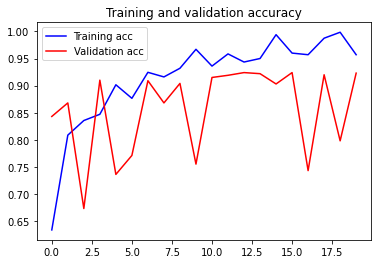

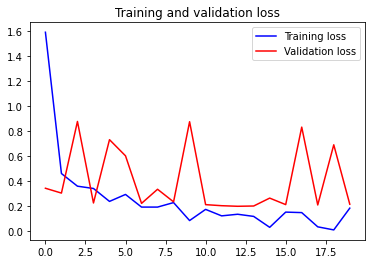

In [11]:
# only ran 1 epoch so dont have the data to graph - i think


# Utility function for plotting of the model results
def visualize_results(history):
    # Plot the accuracy and loss curves
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.plot(epochs, acc, 'b', label='Training acc')
    plt.plot(epochs, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.savefig('dog-cat2-1.svg', dpi=600)

    plt.figure()

    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.savefig('dog-cat2-2.svg', dpi=600)

    plt.show()


# Run the function to illustrate accuracy and loss
visualize_results(history)

In [12]:
acc1 = history.history.keys()
acc= history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
print(acc)

[0.6334999799728394, 0.8084999918937683, 0.8355000019073486, 0.847000002861023, 0.9014999866485596, 0.8765000104904175, 0.9244999885559082, 0.9160000085830688, 0.9319999814033508, 0.9670000076293945, 0.9359999895095825, 0.9585000276565552, 0.9434999823570251, 0.949999988079071, 0.9940000176429749, 0.9599999785423279, 0.9570000171661377, 0.987500011920929, 0.9984999895095825, 0.9570000171661377]


In [13]:
# Utility function for obtaining of the errors 
def obtain_errors(val_generator, predictions):
    # Get the filenames from the generator
    fnames = validation_generator.filenames

    # Get the ground truth from generator
    ground_truth = validation_generator.classes

    # Get the dictionary of classes
    label2index = validation_generator.class_indices

    # Obtain the list of the classes
    idx2label = list(label2index.keys())
    print("The list of classes: ", idx2label)

    # Get the class index
    predicted_classes = np.argmax(predictions, axis=1)

    errors = np.where(predicted_classes != ground_truth)[0]
    print("Number of errors = {}/{}".format(len(errors),validation_generator.samples))
    print('error percentage =', len(errors) / validation_generator.samples )
    print ('corrct percentage =', 1 - len(errors) / validation_generator.samples)
    return idx2label, errors, fnames


# Utility function for visualization of the errors
def show_errors(idx2label, errors, predictions, fnames):
    # Show the errors
    for i in range(len(errors)):
        pred_class = np.argmax(predictions[errors[i]])
        pred_label = idx2label[pred_class]

        title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
            fnames[errors[i]].split('/')[0],
            pred_label,
            predictions[errors[i]][pred_class])

        original = tf.keras.preprocessing.image.load_img('{}/{}'.format(validation,fnames[errors[i]]))
        plt.figure(figsize=[7,7])
        plt.axis('off')
        plt.title(title)
        plt.imshow(original)
        plt.show()

In [16]:
model.save_weights('dog-cat2dell.pkl')

100/100 [==============================] - 194s 2s/step
The list of classes:  ['cats', 'dogs']
Number of errors = 77/1000
error percentage = 0.077
corrct percentage = 0.923


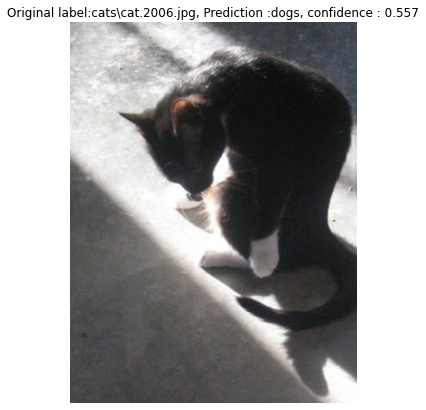

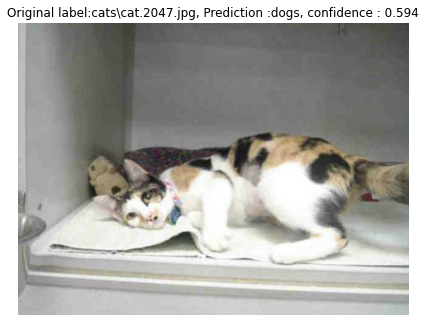

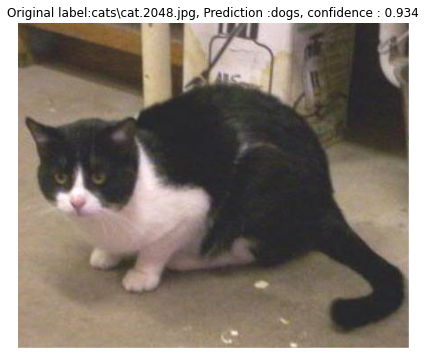

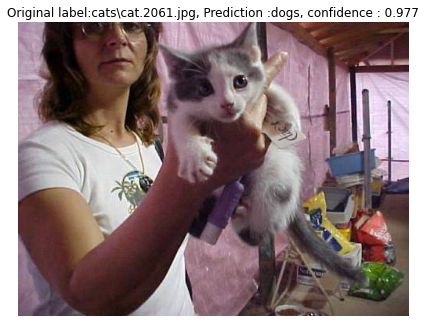

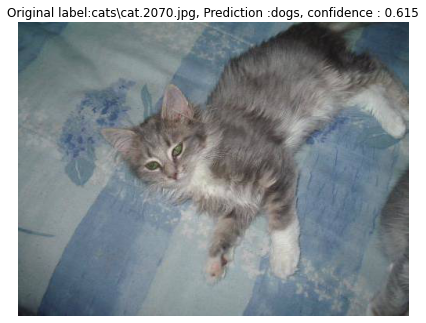

...

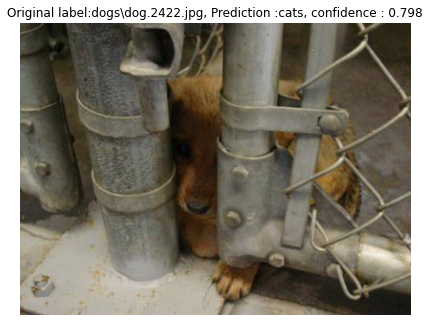

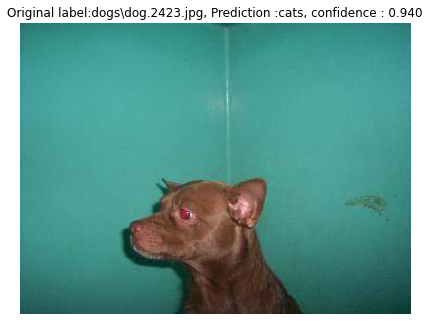

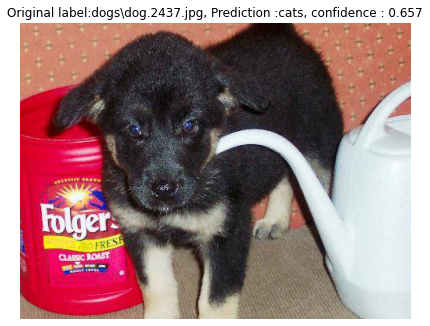

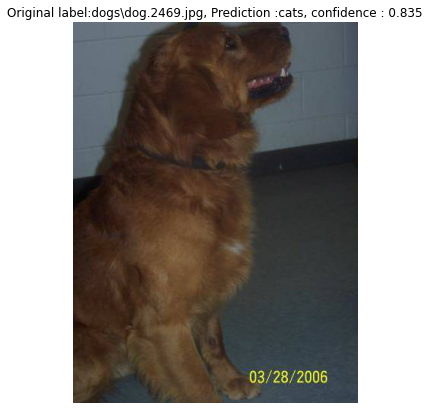

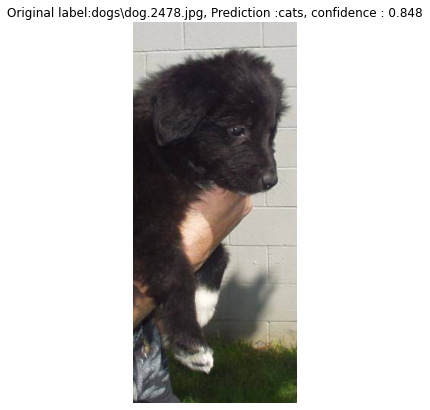

In [14]:
# Get the predictions from the model using the generator
predictions = model.predict(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)

# Run the function to get the list of classes and errors
idx2label, errors, fnames = obtain_errors(validation_generator, predictions)

# Run the function to illustrate the error cases
show_errors(idx2label, errors, predictions, fnames)

In [17]:
idx2label

['cats', 'dogs']

In [18]:
errors

array([  6,  47,  48,  61,  70,  83,  85, 124, 130, 156, 159, 166, 186,
       191, 211, 239, 243, 252, 257, 261, 263, 264, 267, 286, 300, 311,
       316, 337, 379, 384, 391, 396, 415, 422, 442, 457, 476, 509, 516,
       518, 525, 559, 565, 570, 581, 582, 590, 595, 597, 599, 641, 646,
       649, 688, 690, 728, 743, 745, 759, 768, 815, 816, 817, 818, 850,
       862, 869, 876, 895, 897, 908, 918, 922, 923, 937, 969, 978],
      dtype=int64)

In [20]:
len(errors)

77

In [21]:
predictions

array([[9.9973863e-01, 2.6134349e-04],
       [9.9992335e-01, 7.6600780e-05],
       [9.9855369e-01, 1.4463362e-03],
       ...,
       [9.6791678e-07, 9.9999905e-01],
       [6.2201181e-08, 9.9999988e-01],
       [6.5825859e-08, 9.9999988e-01]], dtype=float32)

In [22]:
fnames

['cats\\cat.2000.jpg',
 'cats\\cat.2001.jpg',
 'cats\\cat.2002.jpg',
 'cats\\cat.2003.jpg',
 'cats\\cat.2004.jpg',
 'cats\\cat.2005.jpg',
 'cats\\cat.2006.jpg',
 'cats\\cat.2007.jpg',
 'cats\\cat.2008.jpg',
 'cats\\cat.2009.jpg',
 'cats\\cat.2010.jpg',
 'cats\\cat.2011.jpg',
 'cats\\cat.2012.jpg',
 'cats\\cat.2013.jpg',
 'cats\\cat.2014.jpg',
 'cats\\cat.2015.jpg',
 'cats\\cat.2016.jpg',
 'cats\\cat.2017.jpg',
 'cats\\cat.2018.jpg',
 'cats\\cat.2019.jpg',
 'cats\\cat.2020.jpg',
 'cats\\cat.2021.jpg',
 'cats\\cat.2022.jpg',
 'cats\\cat.2023.jpg',
 'cats\\cat.2024.jpg',
 'cats\\cat.2025.jpg',
 'cats\\cat.2026.jpg',
 'cats\\cat.2027.jpg',
 'cats\\cat.2028.jpg',
 'cats\\cat.2029.jpg',
 'cats\\cat.2030.jpg',
 'cats\\cat.2031.jpg',
 'cats\\cat.2032.jpg',
 'cats\\cat.2033.jpg',
 'cats\\cat.2034.jpg',
 'cats\\cat.2035.jpg',
 'cats\\cat.2036.jpg',
 'cats\\cat.2037.jpg',
 'cats\\cat.2038.jpg',
 'cats\\cat.2039.jpg',
 'cats\\cat.2040.jpg',
 'cats\\cat.2041.jpg',
 'cats\\cat.2042.jpg',
 'cats\\cat

In [23]:
# Run the function to get the list of classes and errors
idx2label, errors, fnames = obtain_errors(validation_generator, predictions)

The list of classes:  ['cats', 'dogs']
Number of errors = 77/1000
error percentage = 0.077
corrct percentage = 0.923


In [24]:
model.save_weights('vgg16-Cat-Dog1.pkl')

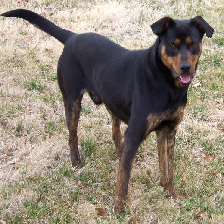

In [25]:
from keras.preprocessing.image import load_img
# load an image from file
image = load_img('dog.jpg', target_size=(224, 224))
image

In [26]:
from keras.preprocessing.image import img_to_array
# convert the image pixels to a numpy array
image = img_to_array(image)

In [27]:
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

In [28]:
from keras.applications.vgg16 import preprocess_input
# prepare the image for the VGG model
image = preprocess_input(image)

In [29]:
yhat = model.predict(image)

In [30]:
yhat1 =  model.predict(image)

In [31]:
yhat

array([[0., 1.]], dtype=float32)

In [32]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  0
